In [53]:
import sys
sys.path.append("../")
import time

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data

import ThinLens.Elements as Elements
import ThinLens.Maps as Maps
from ThinLens.Models import F0D0Model, SIS18_Cell_minimal, SIS18_Cell, \
    SIS18_Lattice_minimal, SIS18_Lattice

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
from IPython.display import set_matplotlib_formats, display
set_matplotlib_formats('pdf', "svg")
import matplotlib.pyplot as plt
import numpy as np

import cpymad.madx

from ThinLens.Beam import Beam
import tools.madX
import tools.plot
import tools.tuneFFT

In [54]:
# general
# torch.set_printoptions(precision=4, sci_mode=False)

dim = 6
slices = 4
quadSliceMultiplicity = 1
dtype = torch.double
device = torch.device("cpu")
outputPerElement = True  # exceeds outputAtBPM
outputAtBPM = True

# set up models
Lattice = SIS18_Lattice

model = Lattice(dim=dim, slices=slices, quadSliceMultiplicity=quadSliceMultiplicity,
                dtype=dtype,).to(device)

perturbedModel = Lattice(dim=dim, slices=slices, quadSliceMultiplicity=quadSliceMultiplicity,
                         dtype=dtype).to(device)

model.requires_grad_(False)
perturbedModel.requires_grad_(False)

SIS18_Lattice(
  (elements): ModuleList(
    (0): Drift(
      (map): DriftMap()
      (maps): ModuleList(
        (0): DriftMap()
      )
    )
    (1): RBen(
      (maps): ModuleList(
        (0): EdgeKick()
        (1): DriftMap()
        (2): DipoleKick()
        (3): DriftMap()
        (4): DriftMap()
        (5): DipoleKick()
        (6): DriftMap()
        (7): DriftMap()
        (8): DipoleKick()
        (9): DriftMap()
        (10): DriftMap()
        (11): DipoleKick()
        (12): DriftMap()
        (13): EdgeKick()
      )
    )
    (2): Drift(
      (map): DriftMap()
      (maps): ModuleList(
        (0): DriftMap()
      )
    )
    (3): RBen(
      (maps): ModuleList(
        (0): EdgeKick()
        (1): DriftMap()
        (2): DipoleKick()
        (3): DriftMap()
        (4): DriftMap()
        (5): DipoleKick()
        (6): DriftMap()
        (7): DriftMap()
        (8): DipoleKick()
        (9): DriftMap()
        (10): DriftMap()
        (11): DipoleKick()
        (

In [55]:
# perturb model
std = 1e-2
for element in perturbedModel.elements:
    if type(element) is Elements.Quadrupole:
        k1n = element.k1n.item()
        k1n = k1n + torch.normal(0, std, size=(1,))
        element.k1n = nn.Parameter(k1n, requires_grad=False)
        element.shareWeights()

for i in range(len(model.elements)):
    if type(model.elements[i]) is Elements.Quadrupole:
        print(model.elements[i].k1n.item() - perturbedModel.elements[i].k1n.item())

-0.006862653287887599
0.007288588455200196
-0.012855197971344046
0.005727218595504735
0.0013389124183654788
-0.012909438198089651
0.01697276732063291
-0.0017042921276092526
0.009859834129333445
-0.013916803392410304
-0.0040262804718017575
-0.0015746017150879421
-0.010945064815521266
-0.004360424110412597
0.010035131389617868
-0.0033234486904144545
-0.008791761228561401
0.004910383636474558
0.02550550004577634
-0.007153438159942627
-0.0006904264144897976
-0.003093434366226222
-0.00022043449592590303
-0.000695671623230032
0.016230451074600194
-0.007340239116668701
0.012030158454894968
0.015551345554351781
-0.004078196117401123
-0.006865109985351614
0.0013474692974090319
0.001453442743301392
0.004283283168792673
-0.011823756488800075
0.013261093070983887
0.009627435619354197


In [56]:
# train set
beam = Beam(mass=18.798, energy=19.0, exn=1.258e-6, eyn=2.005e-6, sigt=0.01, sige=0.000, particles=500)
bunch = beam.bunch[:].to(device)
label = perturbedModel(bunch, outputPerElement=outputPerElement, outputAtBPM=outputAtBPM).to(device)

trainSet = torch.utils.data.TensorDataset(bunch, label)
trainLoader = torch.utils.data.DataLoader(trainSet, batch_size=25,
                                          shuffle=True, num_workers=2)


plot initial model properties

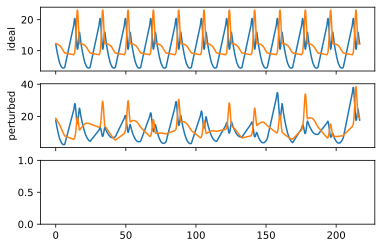

In [57]:
# plot initial trajectories
figTrajectories, axesTrajectories = plt.subplots(2, 2, sharex=True, figsize=(12,8))
for i in range(len(axesTrajectories)):
    for j in range(len(axesTrajectories[i])):
        axesTrajectories[i, j].ticklabel_format(style="sci", scilimits=(0,0))

initialTrajectoriesDifference = tools.plot.track(model, bunch, 1) - tools.plot.track(perturbedModel, bunch, 1)
tools.plot.trajectories(axesTrajectories[0, 0], initialTrajectoriesDifference, model, plane="x")
tools.plot.trajectories(axesTrajectories[0, 1], initialTrajectoriesDifference, model, plane="y")
axesTrajectories[0, 0].set_ylabel("initial diff.")

# plot inital beta
figBeta, axesBeta = plt.subplots(3, sharex=True)
tools.plot.betaMadX(axesBeta[0], model.madX(), )
axesBeta[0].set_ylabel("ideal")

try:
    tools.plot.betaMadX(axesBeta[1], perturbedModel.madX(), )
except cpymad.madx.TwissFailed:
    print("warning: twiss for perturbed model failed")
axesBeta[1].set_ylabel("perturbed")

plt.show()

Text(0, 0.5, 'initial')

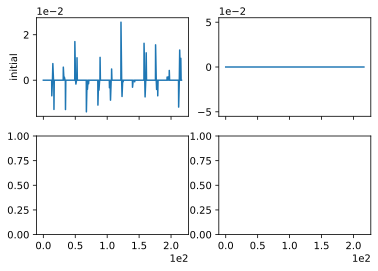

In [58]:
# visualize difference in multipole components
def compareMultipoleStrengths(modelA, modelB):
    diff_k1n, diff_k2n = np.empty(len(modelA.elements)), np.empty(len(modelA.elements))
    diff_k1s, diff_k2s = np.empty(len(modelA.elements)), np.empty(len(modelA.elements))

    for i in range(len(modelA.elements)):
        if type(modelA.elements[i]) is Elements.Quadrupole:
            diff_k1n[i] = modelA.elements[i].k1n.item() - modelB.elements[i].k1n.item()
            diff_k1s[i] = modelA.elements[i].k1s.item() - modelB.elements[i].k1s.item()
            diff_k2n[i] = modelA.elements[i].k2n.item() - modelB.elements[i].k2n.item()
            diff_k2s[i] = modelA.elements[i].k2s.item() - modelB.elements[i].k2s.item()
        else:
            diff_k1n[i] = 0
            diff_k1s[i] = 0
            diff_k2n[i] = 0
            diff_k2s[i] = 0

    return tuple([(diff_k1n, diff_k2n), (diff_k1s, diff_k2s),])

initialDiffNormal, initialDiffSkew = compareMultipoleStrengths(model, perturbedModel)

multipoleFig, multipoleAxes = plt.subplots(2, 2, sharex=True)
for i in range(len(multipoleAxes)):
    for j in range(len(multipoleAxes[i])):
        multipoleAxes[i, j].ticklabel_format(style="sci", scilimits=(0,0))

multipoleAxes[0, 0].plot(model.positions, initialDiffNormal[0])
multipoleAxes[0, 1].plot(model.positions, initialDiffNormal[1])

multipoleAxes[0, 0].set_ylabel("initial")

In [59]:
# with open("/home/conrad/ThesisWorkspace/BayesianOptimization/GaussianPertubation/model.json", "w") as f:
#     model.dumpJSON(f)
# with open("/home/conrad/ThesisWorkspace/BayesianOptimization/GaussianPertubation/perturbedModel.json", "w") as f:
#     perturbedModel.dumpJSON(f)

setup training

In [60]:
# activate gradients on kick maps
for element in model.elements:
    if type(element) is Elements.Quadrupole:
        element.k1n.requires_grad_(True)
        element.k2n.requires_grad_(True)
        
        element.k1s.requires_grad_(False)
        element.k2s.requires_grad_(False)

# set up optimizer
optimizer = optim.Adam(model.parameters(), lr=5e-4)
# optimizer = optim.Adagrad(model.parameters(), lr=1e-3)
criterion = nn.MSELoss()


In [61]:
epochs = 25

# train loop
t0 = time.time()

for epoch in range(epochs):
    for i, data in enumerate(trainLoader, 0):
        bunch, label = data[0], data[1]

        optimizer.zero_grad()

        out = model(bunch, outputPerElement=outputPerElement, outputAtBPM=outputAtBPM)

        # loss = criterion(out, label)  # full phase-space
        loss = criterion(out[:, [0, 2], :], label[:, [0, 2], :])  # only x-, y-plane

        loss.backward()
        optimizer.step()

    # if epoch % 10 == 9:
    #     print(loss.item())
    print(loss.item())

print("training completed within {:.2f}s".format(time.time() - t0))

1.0339566977764106e-10
4.1268394012085225e-11
2.6163494716162273e-11
1.8012575265496165e-11
1.1503756375699813e-11
1.2695361539854633e-11
7.220764028692046e-12
8.128953875891775e-12
5.118026466472637e-12
5.892048113882542e-12
3.7390705073005834e-12
4.647150368277096e-12
2.97287651449431e-12
3.994355911496853e-12
4.123706154438819e-12
4.037529726935629e-12
3.554355532032442e-12
2.8149544977742597e-12
1.7111397812155266e-12
2.2381977519235183e-12
1.825169879303794e-12
1.1714604267779068e-12
2.0897442264167196e-12
1.9674671100628963e-12
2.3345693787148284e-12
training completed within 459.32s


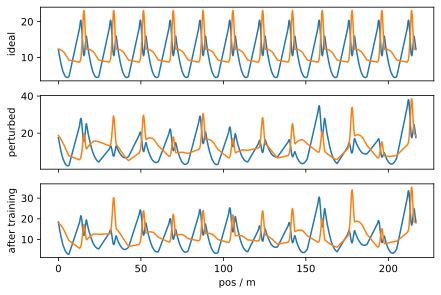

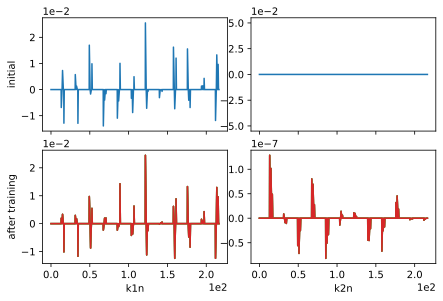

In [68]:
# plot final trajectories
trajectoriesDifference = tools.plot.track(model, bunch, 1) - tools.plot.track(perturbedModel, bunch, 1)

axesTrajectories[1, 0].clear()
tools.plot.trajectories(axesTrajectories[1, 0], trajectoriesDifference, model, plane="x")
axesTrajectories[1, 1].clear()
tools.plot.trajectories(axesTrajectories[1, 1], trajectoriesDifference, model, plane="y")

axesTrajectories[1, 0].set_ylabel("after training")
axesTrajectories[1, 0].set_xlabel("hor. pos / m")
axesTrajectories[1, 1].set_xlabel("ver. pos / m")

display(figTrajectories)

figTrajectories.tight_layout()
figTrajectories.savefig("/dev/shm/SIS18_comparisonTrajectories.pdf", bbox_inches="tight", pad_inches=0)

# plot final beta
axesBeta[2].clear()
try:
    tools.plot.betaMadX(axesBeta[2], model.madX())
except cpymad.madx.TwissFailed:
    print("twiss failed for trained model")
    axesBeta[2].plot(model.endPositions, torch.zeros(len(model.endPositions)))

axesBeta[2].set_ylabel("after training")
axesBeta[2].set_xlabel("pos / m")

display(figBeta)

figBeta.tight_layout()
figBeta.savefig("/dev/shm/SIS18_comparisonBeta.pdf", bbox_inches="tight", pad_inches=0)

# plot final deviation in multipole strengths
finalDiffNormal, finalDiffSkew = compareMultipoleStrengths(model, perturbedModel)

multipoleAxes[1, 0].plot(model.positions, finalDiffNormal[0])
multipoleAxes[1, 1].plot(model.positions, finalDiffNormal[1])

multipoleAxes[1, 0].set_ylabel("after training")
multipoleAxes[1, 0].set_xlabel("k1n")
multipoleAxes[1, 1].set_xlabel("k2n")

display(multipoleFig)

multipoleFig.tight_layout()
multipoleFig.savefig("/dev/shm/SIS18_comparisonMultipoles.pdf", bbox_inches="tight", pad_inches=0)

In [63]:
torch.set_printoptions(precision=3, sci_mode=False)
print(model.rMatrix())

tensor([[ 2.580, 18.164,  0.000,  0.000,  0.000,  0.000],
        [-0.470, -2.923,  0.000,  0.000,  0.000,  0.000],
        [ 0.000,  0.000, -0.550, 13.539,  0.000,  0.000],
        [ 0.000,  0.000, -0.043, -0.768,  0.000,  0.000],
        [-0.478, -1.321,  0.000,  0.000,  1.000,  0.000],
        [ 0.000,  0.000,  0.000,  0.000,  0.000,  1.000]], dtype=torch.float64,
       grad_fn=<MmBackward>)


In [64]:
for element in model.elements:
    if type(element) is Elements.Quadrupole:
        print("k2n={:.2e}, k2s={:.2e}".format(element.k2n.item(), element.k2s.item()))

k2n=1.28e-07, k2s=0.00e+00
k2n=1.02e-07, k2s=0.00e+00
k2n=4.89e-08, k2s=0.00e+00
k2n=8.59e-09, k2s=0.00e+00
k2n=-8.78e-09, k2s=0.00e+00
k2n=-1.06e-08, k2s=0.00e+00
k2n=-5.58e-08, k2s=0.00e+00
k2n=-7.18e-08, k2s=0.00e+00
k2n=-2.53e-08, k2s=0.00e+00
k2n=8.02e-08, k2s=0.00e+00
k2n=6.92e-08, k2s=0.00e+00
k2n=2.78e-08, k2s=0.00e+00
k2n=-8.19e-08, k2s=0.00e+00
k2n=-5.06e-08, k2s=0.00e+00
k2n=-3.34e-08, k2s=0.00e+00
k2n=-1.38e-08, k2s=0.00e+00
k2n=1.41e-08, k2s=0.00e+00
k2n=6.15e-09, k2s=0.00e+00
k2n=1.11e-08, k2s=0.00e+00
k2n=9.72e-09, k2s=0.00e+00
k2n=3.46e-09, k2s=0.00e+00
k2n=-4.48e-08, k2s=0.00e+00
k2n=-4.55e-08, k2s=0.00e+00
k2n=-2.15e-08, k2s=0.00e+00
k2n=-6.71e-08, k2s=0.00e+00
k2n=-2.54e-08, k2s=0.00e+00
k2n=-1.78e-08, k2s=0.00e+00
k2n=3.19e-08, k2s=0.00e+00
k2n=4.55e-08, k2s=0.00e+00
k2n=1.88e-08, k2s=0.00e+00
k2n=-2.93e-09, k2s=0.00e+00
k2n=-1.44e-09, k2s=0.00e+00
k2n=-1.32e-09, k2s=0.00e+00
k2n=-4.18e-09, k2s=0.00e+00
k2n=-1.66e-09, k2s=0.00e+00
k2n=-1.87e-10, k2s=0.00e+00


In [65]:
for element in model.elements:
    if type(element) is Elements.Quadrupole:
        print("k1n={:.2e}, k1s={:.2e}".format(element.k1n.item(), element.k1s.item()))

k1n=3.21e-01, k1s=0.00e+00
k1n=-4.82e-01, k1s=0.00e+00
k1n=6.28e-01, k1s=0.00e+00
k1n=3.10e-01, k1s=0.00e+00
k1n=-4.78e-01, k1s=0.00e+00
k1n=6.26e-01, k1s=0.00e+00
k1n=3.05e-01, k1s=0.00e+00
k1n=-4.85e-01, k1s=0.00e+00
k1n=6.20e-01, k1s=0.00e+00
k1n=3.24e-01, k1s=0.00e+00
k1n=-4.72e-01, k1s=0.00e+00
k1n=6.28e-01, k1s=0.00e+00
k1n=3.21e-01, k1s=0.00e+00
k1n=-4.75e-01, k1s=0.00e+00
k1n=6.29e-01, k1s=0.00e+00
k1n=3.12e-01, k1s=0.00e+00
k1n=-4.73e-01, k1s=0.00e+00
k1n=6.26e-01, k1s=0.00e+00
k1n=3.11e-01, k1s=0.00e+00
k1n=-4.82e-01, k1s=0.00e+00
k1n=6.23e-01, k1s=0.00e+00
k1n=3.15e-01, k1s=0.00e+00
k1n=-4.78e-01, k1s=0.00e+00
k1n=6.26e-01, k1s=0.00e+00
k1n=3.02e-01, k1s=0.00e+00
k1n=-4.83e-01, k1s=0.00e+00
k1n=6.22e-01, k1s=0.00e+00
k1n=3.10e-01, k1s=0.00e+00
k1n=-4.79e-01, k1s=0.00e+00
k1n=6.23e-01, k1s=0.00e+00
k1n=3.13e-01, k1s=0.00e+00
k1n=-4.79e-01, k1s=0.00e+00
k1n=6.25e-01, k1s=0.00e+00
k1n=3.12e-01, k1s=0.00e+00
k1n=-4.78e-01, k1s=0.00e+00
k1n=6.25e-01, k1s=0.00e+00
